# Topic Modeling With BERTopic

* * * 

<div class="alert alert-success">  
    
### Learning Objectives 
    
* Use BERTopic to group r/AmItheAsshole submissions by the issues people write about.
* Interpret and visualize the topics found by the model.
* Try out ways to improve or simplify the model when topics overlap too much or don’t make sense.
* Practice naming and describing topics, and using them to organize or classify new text.
</div>

### Icons Used in This Notebook
💡 **Tip**: How to do something a bit more efficiently or effectively.<br>
⚠️ **Warning:** Heads-up about tricky stuff or common mistakes.<br>
💭 **Reflection**: Reflecting on ethical implications, biases, and social impact in data science.<br>

### Sections
1. [Topic Modeling with BERTopic](#topic)
2. [Explore Selected Topics](#explore)
3. [Reducing Overlap](#reduce)
4. [Finding Representative Posts](#repr)


<a id='topic'></a>

# Topic Modeling with BERTopic

In this notebook, we explore **BERTopic**, a topic modeling tool that leverages BERT embeddings and [c-TF-IDF](https://maartengr.github.io/BERTopic/api/ctfidf.html), to extract topics.

## About BERT Embeddings
BERT embeddings are vector representations of text created by the BERT model, which is a large transformer-based neural network trained to understand language context. Unlike traditional word embeddings (like word2vec), BERT creates contextual embeddings. That means the same word will have different vector representations depending on its surrounding words. BERT processes entire sentences at once, using its attention mechanism to capture meaning and relationships between words.

BERTopic works as follows:

1. **Understands text using BERT:**  <br> 
Instead of just counting words, BERTopic uses a BERT-like Sentence Transformer model (e.g. "all-MiniLM-L6-v2")) to turn each post (up to 512 tokens, to be precise) into a “vector”—a list of numbers that captures the meaning and context of a post. This makes it better at grouping together texts that talk about similar things, even if they use different words. BERT-like models were trained on natural text, including punctuation, function words, and syntactic structure. When we are training the model on our reddit posts, the model:
   - sends the entire document string (the whole Reddit post) to the embedding model.
   - truncates the text at its maximum sequence length (typically 512 tokens).
   - encodes the text internally into token-level embeddings (usually of 384 dimensions).
   - averages (or otherwise pools) them → one dense vector summarizing meaning. That vector represents your entire post in semantic space.

2. **Reduces dimensions:** <br>
BERTopic then uses an algorithm called **UMAP** to reduce these learned embedding dimensions (usually from 384 to 5). It is basically creating a compact version of the embedding space where meaningful clusters can actually emerge.

3. **Clusters similar documents:**  <br> 
BERTopic then looks for clusters (groups) of documents that are close to each other in this vector space. It uses an algorithm called **HDBSCAN** that decides, based on the data, how many clusters (topics) make sense. This means you don’t have to guess the number of topics in advance.

4. **Topic representation (labeling):** <br>
Now that clusters exist, BERTopic gathers all documents in each cluster. It applies class-based TF-IDF (c-TF-IDF) to those clusters of texts to count which words/phrases are most frequent. It uses those counts to label or “describe” each topic with top words. c-TF-IDF treats each cluster (topic) as a "document".


5. **Visualizes topics and documents:**   <br>
BERTopic comes with interactive tools to show you how your topics relate to each other, how common each topic is, and where your documents fit in.

See the [documentation](https://maartengr.github.io/BERTopic/getting_started/embeddings/embeddings.html) to learn more about this pipeline.

## IMPORTANT: Goal of This Notebook

The main goal of this notebook is to see how BERTopic works, but also to understand the techniques that go into creating interpretable topics. 

This is a **highly iterative process** that will depend on the dataset you are working with. You should expect to spend several hours tuning and your model. This is **NOT** a one-shot / "just run the code" process.

My hope is that you will be able to see the levers you have at your disposal to improve your BERTopic models -- and that often, there is no such thing as a silver bullet. 


### Note on package installation
This cell makes sure all the Python packages needed for this lesson are installed.
Running this cell will check for each package and install it if it’s missing, so your notebook runs smoothly.

In [1]:
# restart kernel after running
#%pip install bertopic 

⚠️ **Warning:** This notebook might run slowly on your local machine depending on your system architecture. It should work on GitHub codespaces, however.

## Loading the Data

In [33]:
import pandas as pd

# Load your preprocessed AITA CSV (change the filename if needed)
df = pd.read_csv('../../data/aita_top_subs.csv')

In [3]:
df = df[~df['selftext'].isin(['[deleted]', '[removed]'])].reset_index(drop=True)
df.shape

(8252, 23)

In [36]:
import re

def light_clean(text):
    if not isinstance(text, str):
        return ""
    text = re.sub(r"http\S+|www\.\S+", "", text)
    text = re.sub(r"\s+", " ", text).strip()
    return text

df['selftext_clean'] = df['selftext'].apply(light_clean)
df = df[df['selftext_clean'].str.split().apply(len) > 30]

In [ ]:
docs = df['selftext_clean'].tolist()

## Build and Fit BERTopic Model

💡 **Tip**: The output of this model is **stochastic** because UMAP’s dimensionality reduction, HDBSCAN’s clustering, and random initialization in the embedding and vectorization steps each introduce small elements of randomness. That menas running the same code again may yield slightly different topic groupings and word distributions than those shown here.

In [6]:
from bertopic import BERTopic

topic_model = BERTopic(verbose=True, embedding_model="all-MiniLM-L6-v2", ) # this is the default model

/Users/tomvannuenen/anaconda3/envs/multivalue_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
# converting the docs into embeddings, reducing dimensions, clustering, labeling
topics, probabilities = topic_model.fit_transform(docs)

2025-11-01 15:08:55,288 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 258/258 [00:30<00:00,  8.48it/s]
2025-11-01 15:09:28,164 - BERTopic - Embedding - Completed ✓
2025-11-01 15:09:28,165 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-11-01 15:09:40,117 - BERTopic - Dimensionality - Completed ✓
2025-11-01 15:09:40,118 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-11-01 15:09:40,307 - BERTopic - Cluster - Completed ✓
2025-11-01 15:09:40,310 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-01 15:09:41,349 - BERTopic - Representation - Completed ✓


<a id='explore'></a>

# Explore Extracted Topics

Let's view topic frequencies and the top words per topic.

In [8]:
topic_model.get_topic_info()


,Topic,Count,Name,Representation,Representative_Docs
0,-1,3613,-1_and_to_the_my,"[and, to, the, my, she, her, was, that, it, me]",[I really didn’t think I was the asshole here ...
1,0,210,0_dad_mom_my_me,"[dad, mom, my, me, was, and, to, with, he, when]",[My mom died when I (16f) was 6. My dad remarr...
2,1,173,1_money_my_they_parents,"[money, my, they, parents, brother, to, and, f...",[My (27F) granddad died when I was 3 and left ...
3,2,153,2_the_yard_they_neighbors,"[the, yard, they, neighbors, property, parking...",[Background: I recently purchased several acre...
4,3,149,3_bathroom_he_toilet_it,"[bathroom, he, toilet, it, the, and, period, p...",[I'm writing this because I'm standing my grou...
...,...,...,...,...,...
91,90,12,90_piercings_piercing_ears_pierced,"[piercings, piercing, ears, pierced, tooth, it...",[Hi all. My (46M) daughter (18F) has been maki...
92,91,11,91_money_we_wife_our,"[money, we, wife, our, account, she, finances,...",[I 39M have been married to my wife 36F for tw...
93,92,11,92_sister_money_taxes_her,"[sister, money, taxes, her, she, piano, me, my...","[I am(30f) a musician, playing gigs and at an ..."
94,93,11,93_support_ex_child_money,"[support, ex, child, money, ann, he, his, for,...","[My ex and I have 3 kids (10f, 8f, 5f). We've ..."


### About Topic -1

The first row, Topic -1, in BERTopic is a “catch-all” for documents that don’t fit into any meaningful cluster.

Here's how that works:
- HDBSCAN (the clustering algorithm) automatically labels “noise” or “outlier” documents with -1.
- These are typically posts that are too unique, too generic, or just don’t belong to any clear topic group.
- Including topic -1 in your list of topics will show a “topic” that’s not really coherent, and the top words for -1 are usually either very generic or meaningless.
- Most users ignore topic -1 when reviewing topics and top words, focusing only on the numbered topics (0, 1, 2, …).

There are many posts in this -1 cluster (almost half of our ~8000 posts!), which means we cannot use them for further analysis.

Typical and healthy ranges:
- 10–25% outliers: usually indicates a good, interpretable model.
- Below 5%: might suggest over-clustering (too few distinct topics or too broad topics).
- Above 40%: often means your embeddings are too sparse or the clustering parameters are too strict.



### Look at individual topics 
The `get_topic()` method allows us to see the top words for a topic. These top words should be interpretable; that is, collectively they should point to a topic. If they don't, you have more preprocessing and finetuning to do.

In [9]:
# Show top words for topic 1
topic_model.get_topic(1)

[('money', 0.014671267283675802),
 ('my', 0.013258497673437326),
 ('they', 0.011976947033422817),
 ('parents', 0.011533578100155864),
 ('brother', 0.00948473839343384),
 ('to', 0.00943293251276747),
 ('and', 0.009082229221202623),
 ('for', 0.008863215498805418),
 ('them', 0.00873987945313096),
 ('me', 0.008361985785484869)]

As you can see, this topic (like many others) is full of function words. 

### Look at topics per document
BERTopic can also take our input documents (i.e., our Reddit posts in df['selftext']) and return a DataFrame that maps each document → its topic assignment + metadata:

In [10]:
topic_model.get_document_info(df['selftext'])

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,I’ve enjoyed reading and posting on this sub f...,33,33_you_her_of_posts,"[you, her, of, posts, on, she, the, it, to, post]",[I recently got in contact with my bio sister....,you - her - of - posts - on - she - the - it -...,0.597417,False
1,My brother in-law (Sammy) lost his home shortl...,14,14_makeup_wearing_wear_clothes,"[makeup, wearing, wear, clothes, she, of, bra,...",[TLDR: My best friend thinks I will overshadow...,makeup - wearing - wear - clothes - she - of -...,0.890785,False
2,"I'm back like I said I would be,. My [original...",21,21_sister_her_she_my,"[sister, her, she, my, me, was, to, and, paren...",[My (19F) sister in law’s (27) little sister p...,sister - her - she - my - me - was - to - and ...,0.741655,False
3,I am a high schooler with a weekend job at a c...,35,35_boss_the_job_company,"[boss, the, job, company, was, work, me, you, ...",[So I 28m have been with my company for 6 year...,boss - the - job - company - was - work - me -...,0.879345,False
4,We had a family dinner this evening. My family...,58,58_sister_brother_my_me,"[sister, brother, my, me, and, was, he, to, fa...",[So two major parts of my life converged recen...,sister - brother - my - me - and - was - he - ...,0.923556,False
...,...,...,...,...,...,...,...,...
8238,For the past few years I’ve been pretty good a...,32,32_gifts_christmas_gift_the,"[gifts, christmas, gift, the, and, for, it, th...",[I try to not be spoiled but my whole life I h...,gifts - christmas - gift - the - and - for - i...,0.614071,False
8239,This is so stupid. I can’t believe I’m even po...,-1,-1_and_to_the_my,"[and, to, the, my, she, her, was, that, it, me]",[I really didn’t think I was the asshole here ...,and - to - the - my - she - her - was - that -...,0.000000,False
8240,\nI divorced my wife shortly after our 11 year...,-1,-1_and_to_the_my,"[and, to, the, my, she, her, was, that, it, me]",[I really didn’t think I was the asshole here ...,and - to - the - my - she - her - was - that -...,0.000000,False
8241,My younger sister is getting married to my ex ...,-1,-1_and_to_the_my,"[and, to, the, my, she, her, was, that, it, me]",[I really didn’t think I was the asshole here ...,and - to - the - my - she - her - was - that -...,0.000000,False


### Intertopic Distance Map
The `visualize_topics` function visualizes topics and their similarity in an interactive plot. We're also saving it to disk so it can be embedded on a website.

This is a **very helpful** visualization. In this 2D space, we ideally want to see topics that are non-overlapping, and spread across the space. 

In [11]:
fig = topic_model.visualize_topics()
fig.show()

<a id='reduce'></a>

# Issues With Our Topic Model

Common issues when you build your first topic model:

1. **Vocabulary**. It seems our topics are not very interpretable -- they have lots of function words like and, to, my, her, the, she etc. We need to control the vocabulary. We could consider removing stopwords, punctuation, or lemmatizing. However, if we do that in our preprocessing function, we could actually hurt topic quality, because it disrupts the contextual flow the BERT model was trained on. 

2. **Outliers**. We have lots of outlier documents, which have not been classified usefully at all. Reducing the number of -1 outliers is not always the goal — it’s more about balance.

3. **Overlap**. Our intertopic distance map shows lots of overlapping bubbles, meaning our model has produced **too many fine-grained topics**. This is common. Similar documents can get split into clusters that aren't really distinct.

BERTopic allows us to change some **hyperparameters** at different steps of the model to improve it. Let's see what we can do to try and ameliorate these issues.

### 1. Controlling Vocabulary: Add a custom vectorizer

Second, to prevent that topic keywords are full of stopwords and random filler, we can give BERTopic a better word list to use when running TF-IDF. We can do that by passing in a custom `CountVectorizer` that BERTopic uses to build its c-TF-IDF on. 

We can remove some common stopwords, as well as a hand-picked list of common words from this corpus. This is an iterative process: have a look at your topics, figure out which low-information terms appear in all topics (or one huge topic), and add them to this list. 

Note: this CountVectorizer runs *after* creating the BERT embeddings model, reducing dimensionality, and clustering it with HDBSCAN. This means the model still learns good representations from the natural input text -- we simply filter the words shown in these topics.

The result we expect from this: cleaner topic labels, and more interpretable word clusters.

In [12]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords

stopwords_nltk = stopwords.words('english')
aita_stopwords = stopwords_nltk + [
    'aita', 'yta', 'nta', 'esh', 'info', 'asshole', 'op',
    'edit', 'update', 'post', 'story',
    'please', 'thank', 'thanks', 'hi', 'hello',
    'said', 'told', 'like', 'would', 'get',
    'got', 'time','one','want','really','asked','know',
    'thing','things','feel','felt','make','made', 'since', 'go', 'going'
]

# we will also include bigram tokens
vectorizer = CountVectorizer(stop_words=aita_stopwords,
                             ngram_range=(1, 2))

We will pas this `vectorizer` into the model when we retrain it.

In [13]:
topic_model_v2 = BERTopic(embedding_model="all-MiniLM-L6-v2", vectorizer_model=vectorizer, 
                          calculate_probabilities=True, verbose=True) 

In [14]:
# converting the docs into embeddings, reducing dimensions, clustering, labeling
topics_v2, probabilities_v2 = topic_model_v2.fit_transform(docs)

2025-11-01 15:09:45,679 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 258/258 [00:29<00:00,  8.69it/s]
2025-11-01 15:10:17,520 - BERTopic - Embedding - Completed ✓
2025-11-01 15:10:17,520 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-11-01 15:10:19,789 - BERTopic - Dimensionality - Completed ✓
2025-11-01 15:10:19,790 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-11-01 15:10:21,672 - BERTopic - Cluster - Completed ✓
2025-11-01 15:10:21,675 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-01 15:10:25,766 - BERTopic - Representation - Completed ✓


In [15]:
# have a look again at how many topics we have, and how big our outlier topic is
topic_model_v2.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,3409,-1_husband_family_wife_sister,"[husband, family, wife, sister, kids, mom, us,...",[I'm 25 & I'm the caretaker but not the legal ...
1,0,493,0_wedding_dress_married_family,"[wedding, dress, married, family, sister, fian...",[Throwaway Account I (30f) have been with my h...
2,1,370,1_ex_son_daughter_child,"[ex, son, daughter, child, wife, baby, pregnan...",[I (M 30) was married for about six years befo...
3,2,228,2_dad_mom_parents_mother,"[dad, mom, parents, mother, family, father, ye...",[My beautiful baby sister lost her battle with...
4,3,164,3_yard_neighbors_property_neighbor,"[yard, neighbors, property, neighbor, parking,...",[This will probably be rather short and I am n...
...,...,...,...,...,...
89,88,10,88_air conditioner_conditioner_thread_pillow,"[air conditioner, conditioner, thread, pillow,...",[Recently I've been having trouble sleeping. I...
90,89,10,89_wife_kids_work_school,"[wife, kids, work, school, stepdaughter, worke...","[I(29M) Have 2 kids, 8F and 5M. I am a pediatr..."
91,90,10,90_cameras_camera_security_security cameras,"[cameras, camera, security, security cameras, ...",[I have a vacation home and now that things ha...
92,91,10,91_name_kanae_teacher_pronounce,"[name, kanae, teacher, pronounce, english, ceo...","[My OH has always been a bit goofy, giving his..."


### 2. Reduce the Number of Topics

To prevent redundant and overlapping clusters, we can merge semantically similar topics using BERTopic’s internal topic similarity.
We can do this with the `reduce_topics` method:

In [16]:
# Reduce the number of topics (set to the number you want)
topic_model_v2.reduce_topics(docs, nr_topics=30)

2025-11-01 15:10:27,351 - BERTopic - Topic reduction - Reducing number of topics
2025-11-01 15:10:27,370 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-01 15:10:31,607 - BERTopic - Representation - Completed ✓
2025-11-01 15:10:31,616 - BERTopic - Topic reduction - Reduced number of topics from 94 to 30


In [17]:
# look again at the topic info
topic_model_v2.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,3409,-1_family_husband_wife_sister,"[family, husband, wife, sister, mom, kids, us,...","[I'm back like I said I would be,. My [origina..."
1,0,864,0_dad_mom_parents_sister,"[dad, mom, parents, sister, brother, family, m...","[Okay, so my parents got divorced when I was 1..."
2,1,554,1_wedding_dress_family_ring,"[wedding, dress, family, ring, married, sister...",[My (27F) fiancée (28M) and I have been dating...
3,2,515,2_daughter_son_ex_wife,"[daughter, son, ex, wife, child, husband, kids...",[My ex husband left me when I was 2 months pre...
4,3,401,3_hair_wear_bathroom_think,"[hair, wear, bathroom, think, clothes, look, m...",[Dad (42) and my his fiancee (Alice 28) are ge...
5,4,361,4_eat_food_weight_vegan,"[eat, food, weight, vegan, meat, eating, cake,...",[My MIL hosted a bbq at her house last weekend...
6,5,231,5_car_yard_house_neighbors,"[car, yard, house, neighbors, property, neighb...",[The reason I am asking is because they were/a...
7,6,188,6_room_house_roommate_apartment,"[room, house, roommate, apartment, rent, home,...",[Okay this happened a while back (around a yea...
8,7,185,7_friends_work_friend_guy,"[friends, work, friend, guy, people, job, boss...","[Obligatory on mobile. So me and my boyfriend,..."
9,8,185,8_dog_cat_dogs_cats,"[dog, cat, dogs, cats, home, vet, house, pet, ...",[My boyfriend and I got engaged in October of ...


In [18]:
fig = topic_model_v2.visualize_topics()
fig.show()

Zoom in on the graph to see different clusters of topics.

### 4. Hyperparameter Tuning

There are many more things we can do to try and improve our model:

- We can change the minimum amount of documents a topic contains with the `min_topic_size` hyperparameter in BERTopic.
- We can adjust HDBSCAN’s hyperparameters, such as the minimum cluster size using the `min_cluster_size` hyperparameter to allow smaller, more granular clusters.
- We can change the hyperparameters for UMAP.
- We can try a different embedding model like `all-distilroberta-v1`.

⚠️ **Warning:** While these steps can help reduce outliers, they also to an explosion of topics. The goal is to strike a balance.

Let's try and change some hyperparameters now. Expect this to take longer than our initial run!


In [19]:
from bertopic import BERTopic
from umap import UMAP
from hdbscan import HDBSCAN

# Dimensionality reduction
# for more info on these parameters, see https://hdbscan.readthedocs.io/en/latest/api.html 

umap_model = UMAP(
    n_neighbors=15,       # local vs global structure
    n_components=10,      # dimensionality of reduced space
    min_dist=0.0,         # tighter clusters
    metric="cosine",
    random_state=42
)

# Density-based clustering
hdbscan_model = HDBSCAN(
    min_cluster_size=10,  # how many docs per topic (granularity)
    min_samples=2,        # how strict the clustering is
    prediction_data=True,
    cluster_selection_method="eom" # how clusters are calculated -> "leaf" results in more granular clusters 
)

# Topic model
topic_model_v3 = BERTopic(
    embedding_model="all-distilroberta-v1",  # can also try another model, e.g. all-mpnet-base-v2
    vectorizer_model=vectorizer,          # custom stopwords here
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    min_topic_size=20,                    # smallest amount of document allowed in a topic -> smaller number means more granular topics
    calculate_probabilities=True,
    verbose=True
)

topics_v3, probabilities_v3 = topic_model_v3.fit_transform(docs)

2025-11-01 15:10:32,816 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 258/258 [02:15<00:00,  1.90it/s]
2025-11-01 15:12:50,981 - BERTopic - Embedding - Completed ✓
2025-11-01 15:12:50,983 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-11-01 15:13:01,465 - BERTopic - Dimensionality - Completed ✓
2025-11-01 15:13:01,469 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-11-01 15:13:07,446 - BERTopic - Cluster - Completed ✓
2025-11-01 15:13:07,466 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-01 15:13:11,982 - BERTopic - Representation - Completed ✓


In [20]:
topic_model_v3.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,2971,-1_family_mom_sister_wife,"[family, mom, sister, wife, husband, kids, us,...","[Let me start off by saying my son, Adam, is 2..."
1,0,394,0_dog_cat_dogs_neighbors,"[dog, cat, dogs, neighbors, yard, neighbor, ho...",[I have a dog that has very high prey drive wh...
2,1,178,1_roommate_room_apartment_rent,"[roommate, room, apartment, rent, roommates, l...",[So we are four 20 year old girls in our first...
3,2,137,2_name_names_last name_named,"[name, names, last name, named, baby, middle n...","[My father, who I was extremely close with, pa..."
4,3,114,3_husband_sleep_home_work,"[husband, sleep, home, work, wake, night, day,...",[# update below When covid19 started my husban...
...,...,...,...,...,...
164,163,10,163_job_work_position_chores,"[job, work, position, chores, wife, trimester,...",[My wife (F26) and I (M26) have been married f...
165,164,10,164_birth control_period_periods_control,"[birth control, period, periods, control, sex,...",[My buddy (let’s call him Ben) and his girlfri...
166,165,10,165_wife_mom_soap_makeup,"[wife, mom, soap, makeup, molly, hb, stepdad, ...","[My mom and my wife have never been close, but..."
167,166,10,166_taxes_school_siblings_money,"[taxes, school, siblings, money, insurance, ta...","[I'm 26f. I have 7 siblings. Ages 23m, 21m, 17..."


Let's reduce our topics again:

In [21]:
# Reduce the number of topics (set to the number you want)
topic_model_v3.reduce_topics(docs, nr_topics=50)

2025-11-01 15:13:14,277 - BERTopic - Topic reduction - Reducing number of topics
2025-11-01 15:13:14,313 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-01 15:13:18,878 - BERTopic - Representation - Completed ✓
2025-11-01 15:13:18,887 - BERTopic - Topic reduction - Reduced number of topics from 169 to 50


In [22]:
topic_info_v3 = topic_model_v3.get_topic_info()
topic_info_v3

,Topic,Count,Name,Representation,Representative_Docs
0,-1,2971,-1_family_mom_sister_wife,"[family, mom, sister, wife, husband, kids, us,...",[I'm 25 & I'm the caretaker but not the legal ...
1,0,631,0_dog_house_cat_home,"[dog, house, cat, home, room, apartment, roomm...",[First time ever writing in! Background: I ren...
2,1,391,1_dad_parents_mom_sister,"[dad, parents, mom, sister, family, brother, n...",[My parents have a great relationship...well t...
3,2,382,2_wedding_ring_dress_family,"[wedding, ring, dress, family, married, wear, ...",[I’m getting married to my fiancé (26 M) come ...
4,3,269,3_daughter_wife_kids_son,"[daughter, wife, kids, son, husband, brother, ...","[My (17F) older brother 32(M) has a kid (3M), ..."
5,4,241,4_baby_pregnant_pregnancy_husband,"[baby, pregnant, pregnancy, husband, birth, wi...",[My brother and his wife had their first baby ...
6,5,236,5_money_college_dad_brother,"[money, college, dad, brother, school, pay, da...",[Throwaway Account I (48m) have three children...
7,6,221,6_hair_look_wear_think,"[hair, look, wear, think, clothes, even, cut, ...",[edited to add- to the people out there with c...
8,7,204,7_ex_daughter_son_wife,"[ex, daughter, son, wife, kids, child, years, ...",[My ex husband left me when I was 2 months pre...
9,8,184,8_vegan_eat_food_meat,"[vegan, eat, food, meat, dinner, cook, eating,...","[Okay my boyfriend is very much ""anti-vegan"" i..."


In [23]:
# Re-visualize the intertopic distance map
fig = topic_model_v3.visualize_topics()
fig.show()

## Picking a Model

Let's pick our tuned model going forward. It has a lot of outliers still, unfortunately.

In your own data, if you want to use your topic modeling labels for downstream analysis, you will want to try and reduce those outliers -- otherwise you won't be able to use these posts!

### Visualizing all docs
We can use the `visualize_documents` method to visualize our posts in 2d space see the clustering. Note that the clusters are labeled with their number and the top words in the cluster.
 
⚠️ **Warning:** Rendering this visualization might take a while!

In [24]:
topic_model_v3.visualize_documents(docs, topics=topics_v3)

Let's say I'm interested in topic 4.

**⚠️ Warning:** If you run this code again your topics might look different due to the probabilistic nature of UMAP. 

In [25]:
docs_per_topic = topic_model_v3.get_representative_docs()
docs_per_topic[4]


['My brother and his wife had their first baby 7 months ago. My mother who lives with me recently started watching the baby instead of placing in daycare. So the baby is at my house all week. It’s been a month and my mom says that the baby barely sleeps. Will cry and show signs of tiredness, but only naps for half an hour at the most. My brother and SIL have also told us the baby still wakes up almost every 1-2 hours throughout the night like a newborn and it’s extremely exhausting. They’ve tried plenty of different things but nothing has improved much. The baby only drinks breast milk. While I know EVERY baby is different, and what works for some might not others, I still can’t help but think they aren’t feeding the baby enough. As a mother of 3 myself, all my kids started differently (one ate baby cereal at 4 months, another didn’t take to solids until 6m) but I think I have a good sense of when a baby is ready to start taking in more. After finding out that they only feed the baby 4

## Grab all posts from a certain topic (for further processing)

Once you’ve trained a BERTopic model, each document is assigned a dominant topic. You can use this assignment to extract all posts that belong to a specific topic for closer analysis, visualization, or downstream tasks.

For instance, let's create a new dataframe with all posts that have topic 4 as the dominant topic.

First, let's add topics and probabilities to our original DataFrame.

In [40]:
import pandas as pd

# Add dominant topic per document
df["dominant_topic"] = topics_v3

# Optionally: add the highest probability (confidence)
import numpy as np
df["topic_confidence"] = np.max(probabilities_v3, axis=1)

In [27]:
# Example: compare topic 4 vs topic 7
df_topic4 = df[df["dominant_topic"] == 4].copy()
df_topic7 = df[df["dominant_topic"] == 7].copy()


## Example: Compare Sentiment Between Topics

What can we do with this new set of topic categories? For instance, we can compare average sentiments between two interesting topics.

We can use the transformers pipeline from Hugging Face -- a modern approach that:

- uses RoBERTa, trained on millions of social-media posts.
- quickly classifies each post as positive / neutral / negative.
- produces a small comparison table showing sentiment ratios per topic.

In [28]:
from transformers import pipeline

# Load a modern sentiment model
sentiment_analyzer = pipeline("sentiment-analysis",
                              model="cardiffnlp/twitter-roberta-base-sentiment-latest")

# Apply it (keep short for this demo)
df_topic4["sentiment"] = df_topic4["selftext"].head(50).apply(lambda x: sentiment_analyzer(x[:512])[0]["label"])
df_topic7["sentiment"] = df_topic7["selftext"].head(50).apply(lambda x: sentiment_analyzer(x[:512])[0]["label"])


Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Device set to use mps:0


In [29]:
# Compare proportions
comparison = (
    pd.concat([
        df_topic4.assign(topic="Topic 4"),
        df_topic7.assign(topic="Topic 7")
    ])
    .groupby(["topic", "sentiment"])
    .size()
    .unstack(fill_value=0)
    .apply(lambda x: x / x.sum(), axis=1)
)

print(comparison)

sentiment  negative  neutral  positive
topic                                 
Topic 4        0.26     0.62      0.12
Topic 7        0.48     0.44      0.08


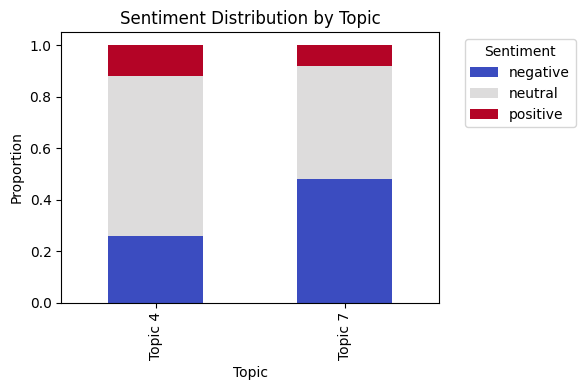

In [30]:
import matplotlib.pyplot as plt

# Plot as stacked bar chart
comparison.plot(kind="bar", stacked=True, colormap="coolwarm", figsize=(6,4))
plt.title("Sentiment Distribution by Topic")
plt.xlabel("Topic")
plt.ylabel("Proportion")
plt.legend(title="Sentiment", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# Visualizing Topics Over Time

BERTopic can show you how topics change over time. This is helpful for understanding trends, seasonal patterns, or how certain topics gain or lose popularity in your dataset.

To do this, we need:
- Our list of documents
- The topics assigned to each document
- A timestamp for each document

## Converting Timestamps

First, we need to convert the Unix timestamps in the `created` column to readable dates. Unix timestamps are numbers representing seconds since January 1, 1970.

In [41]:
# Convert Unix timestamp to datetime
df['timestamp'] = pd.to_datetime(df['created'], unit='s')

# Look at the first few timestamps
df['timestamp'].head()

0   2019-09-20 16:51:40
1   2021-07-03 12:36:22
2   2019-03-11 16:41:02
3   2019-12-03 17:07:53
4   2019-07-27 13:11:51
Name: timestamp, dtype: datetime64[ns]

## Creating the Topics Over Time Visualization

Now we can use BERTopic's `topics_over_time()` function to calculate how each topic appears across different time periods. This function groups documents by time bins and counts topic frequencies.

In [52]:
# Ensure timestamps are clean and properly formatted
# We do this once here, not at the very start of your notebook, 
# so we don't drop any rows that might still be useful for modeling
df = df.dropna(subset=["timestamp"]).reset_index(drop=True)
timestamps = pd.to_datetime(df["timestamp"]).dt.to_pydatetime().tolist()

# Verify your topic assignments are valid after reduction.
# Sometimes reduce_topics renumbers or merges topics.
valid_topics = set(topic_model_v3.get_topic_info()["Topic"])
topics_v3_clean = [t if t in valid_topics else -1 for t in topics_v3]

# Compute topic dynamics over time.
topics_over_time = topic_model_v3.topics_over_time(
    docs=docs,
    topics=topics_v3_clean,
    timestamps=timestamps,
    nr_bins=20,          # number of time bins to group posts
    global_tuning=False  # avoid index errors with reduced topics
)

20it [01:24,  4.25s/it]


In [53]:
# Interactive visualization using Plotly
topic_model_v3.visualize_topics_over_time(topics_over_time)

### Interpreting the Visualization

The plot above shows how frequently each topic appears over time. Each line represents a different topic, and you can:

- **See trends**: Which topics became more or less popular over time?
- **Identify spikes**: Were certain topics only discussed during specific periods?
- **Compare topics**: Which topics dominate your dataset at different points in time?

💡 **Tip**: You can hover over the lines to see the topic number and frequency at specific dates. You can also click on topic numbers in the legend to show/hide specific topics.